## Importing and Installing Detectron2

In [ ]:
!python -m pip install pyyaml==5.1
import sys, os, distutils.core
# Note: This is a faster way to install detectron2 in Colab, but it does not include all functionalities.
# See https://detectron2.readthedocs.io/tutorials/install.html for full installation instructions
!git clone 'https://github.com/facebookresearch/detectron2'
dist = distutils.core.run_setup("./detectron2/setup.py")
!python -m pip install {' '.join([f"'{x}'" for x in dist.install_requires])}
sys.path.insert(0, os.path.abspath('./detectron2'))

# Properly install detectron2. (Please do not install twice in both ways)
# !python -m pip install 'git+https://github.com/facebookresearch/detectron2.git'

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 274 kB 15.3 MB/s 
  Created wheel for pyyaml: filename=PyYAML-5.1-cp37-cp37m-linux_x86_64.whl size=44092 sha256=0e15a6075d1286621c624fc4efe1900d05d25d4e4095c8350125c20348bad780
  Stored in directory: /root/.cache/pip/wheels/77/f5/10/d00a2bd30928b972790053b5de0c703ca87324f3fead0f2fd9
Successfully built pyyaml
  Attempting uninstall: pyyaml
    Found existing installation: PyYAML 6.0
    Uninstalling PyYAML-6.0:
      Successfully uninstalled PyYAML-6.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
dask 2022.2.0 requires pyyaml>=5.3.1, but you have pyyaml 5.1 which is incompatible.
Cloning into 'detectron2'...
remote: Enumerating objects: 14608, done.
remote: Counting objects: 100% (25/25), done.
remote: Compressing objects:

## Importing Detectron2

In [ ]:
import torch, detectron2
!nvcc --version
TORCH_VERSION = ".".join(torch.__version__.split(".")[:2])
CUDA_VERSION = torch.__version__.split("+")[-1]
print("torch: ", TORCH_VERSION, "; cuda: ", CUDA_VERSION)
print("detectron2:", detectron2.__version__)

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2021 NVIDIA Corporation
Built on Sun_Feb_14_21:12:58_PST_2021
Cuda compilation tools, release 11.2, V11.2.152
Build cuda_11.2.r11.2/compiler.29618528_0
torch:  1.12 ; cuda:  cu113
detectron2: 0.6


In [ ]:
# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import os, json, cv2, random
from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog

In [ ]:
from IPython.core import prefilter
import detectron2 
import os
import sys
import numpy as np
import json, cv2, random
from google.colab.patches import cv2_imshow
import matplotlib.pyplot as plt
import requests


### Function Down below saves the Images as JPG Files

In [ ]:
def webimages(links):
  for i in range(len(links)):
    r = requests.get(links[i])
    if(r.status_code == 200):
      with open('input%i.jpg'%(i), 'wb') as f:
        f.write(r.content)
        f.close

links = ["https://blog-www.pods.com/wp-content/uploads/2019/11/MG_NY_6_5_Friends_New_York-1024x711.jpg", "https://freedesignfile.com/upload/2018/09/Senior-man-sitting-on-park-bench-reading-newspaper-Stock-Photo.jpg", "https://www.uncommoncaribbean.com/wp-content/uploads/2018/10/DJI_0096.jpg"]

webimages(links)

### Panoptic Segmentation Model

In [ ]:
# Inference with a panoptic segmentation model
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-PanopticSegmentation/panoptic_fpn_R_101_3x.yaml"))
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-PanopticSegmentation/panoptic_fpn_R_101_3x.yaml")
predictor = DefaultPredictor(cfg)


model_final_cafdb1.pkl: 261MB [00:12, 21.0MB/s]                           


#### Gets the average location for a specific region in the Panoptic Segmentation

In [ ]:

def get_average(val, segmentation_pred):
  x_arr = []
  y_arr = []
  for x in range(len(segmentation_pred)):
          for j in range(len(segmentation_pred[x])):
                  if(segmentation_pred[x][j] == val):
                    x_arr.append(x)
                    y_arr.append(j)
  return np.mean(y_arr), np.mean(x_arr)


#### This functionreads the image and draws the predicted segmentation
#### We also output the predicted class array for each pixel, to calculate the average coordinate value

In [ ]:
import matplotlib.pyplot as plt

def show_img_pan(path, val, extra=False):
  # Reading in the image data
  im = cv2.imread(path)

  # panoptic_seg captures the predicted class ID for all of the pixels
  # Segment Info shows if it is Stuff or Thing along with the Segment/Category ID
  panoptic_seg, segments_info = predictor(im)["panoptic_seg"]
  metadata = MetadataCatalog.get(cfg.DATASETS.TRAIN[0])
  v = Visualizer(im[:, :, ::-1], metadata, scale=1.2)
 
  detected_class_indexes = predictor(im)['instances'].pred_classes
  prediction_boxes = predictor(im)['instances'].pred_boxes
  

 
  
  out = v.draw_panoptic_seg_predictions(panoptic_seg.to("cpu"), segments_info)

  class_catalog = metadata.thing_classes
  stuff_catalog = metadata.stuff_classes


  # Gets the stuff values from the segmentation predictions
  stuff_dict = [x for x in segments_info if x['isthing'] == False]

  #Gets the category ID From the stuff object, this will be use to name the Stuff Object
  stuff_val = [x['category_id'] for x in stuff_dict if x['id'] == val][0]


  

  for idx, coordinates in enumerate(prediction_boxes):
    class_index = detected_class_indexes[idx]
    class_name = class_catalog[class_index]
    print(class_name, coordinates)
  
  x,y = get_average(val, panoptic_seg.cpu().data.numpy())
  



  
  
  print("The average coordinate for the ", stuff_catalog[stuff_val], " is ", (x,y))
  


 


  plt.figure(figsize = (14, 10))
  
  plt.imshow(cv2.cvtColor(out.get_image()[:, :, ::-1], cv2.COLOR_BGR2RGB))
  
 
  plt.show()  

  
  # cv2_imshow(out.get_image()[:, :, ::-1])
  return panoptic_seg, segments_info, stuff_catalog, predictor(im)['instances'].pred_masks
 
  


#### This image consists of the segmentation mask and we also print out the average location for the Sky

/usr/local/lib/python3.7/dist-packages/torch/functional.py:478: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2894.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


person tensor([2667.0449, 1783.1875, 2745.1951, 1942.8928], device='cuda:0')
umbrella tensor([2715.6809, 1798.5762, 2817.7224, 1851.9226], device='cuda:0')
car tensor([3498.1755, 2070.1240, 3576.6528, 2116.7288], device='cuda:0')
umbrella tensor([2667.7849, 1794.5667, 2814.7356, 1871.5356], device='cuda:0')
car tensor([2575.1174, 1212.8350, 2688.4556, 1263.1644], device='cuda:0')
person tensor([2661.1248, 1738.8549, 2861.9541, 1903.2770], device='cuda:0')
person tensor([2673.2034, 1772.4520, 2715.9473, 1825.1254], device='cuda:0')
The average coordinate for the  sky  is  (1970.2688381228745, 481.4717421092409)


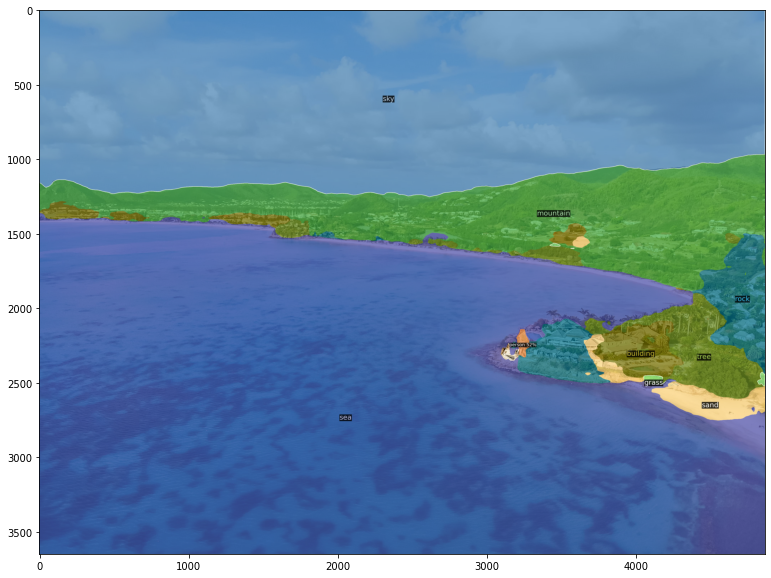

In [ ]:
pred, segment, stuff, pred_masks = show_img_pan('input2.jpg', 5)

## We are trying to create a boundary between the Sea and the Mountain/Grass region. So we mask all values that aren't 3 because 3 represents the Sea. 

## The Matrix we are masking includes the predicted class for each pixel.

In [ ]:
import functools
pred_arr = pred.cpu().data.numpy()

vals = np.array([3])
mask = functools.reduce(np.logical_or, (pred_arr==val for val in vals))

masked = np.where(mask, pred_arr, 0.)

masked

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [3., 3., 3., ..., 3., 3., 3.],
       [3., 3., 3., ..., 3., 3., 3.],
       [3., 3., 3., ..., 3., 3., 3.]])

### Calculating the Difference matrix for the X axis

- We make all non-zero elements one. So the difference matrix will be all 0 and 1s
- The reason we calculate the difference matrix is because if there is no difference between adjacent pixels it means it is the same object
  - But if we find a difference, that means we found a different object which means there is a potential boundary

In [ ]:
im = cv2.imread('input2.jpg')

zeros1 = np.zeros(4056)
result1 = np.diff(masked, axis=0)
b1 = np.where(result1 > 0, 1, result1)




metadata = MetadataCatalog.get(cfg.DATASETS.TRAIN[0])
v = Visualizer(im[:, :, ::-1], metadata, scale=1.2)
 

  

 
  
out1 = v.draw_panoptic_seg_predictions(torch.from_numpy(np.append(b1, [zeros1], axis=0)), segment)

### Calculating the Difference matrix for the Y axis

In [ ]:
metadata = MetadataCatalog.get(cfg.DATASETS.TRAIN[0])
v = Visualizer(im[:, :, ::-1], metadata, scale=1.2)
 

  

 
  
out3 = v.draw_panoptic_seg_predictions(pred.to("cpu"), segment)
gray = cv2.cvtColor(out3.get_image()[:,:,::-1], cv2.COLOR_BGR2GRAY)

### Attempting Edge Detection to Find the Boundaries

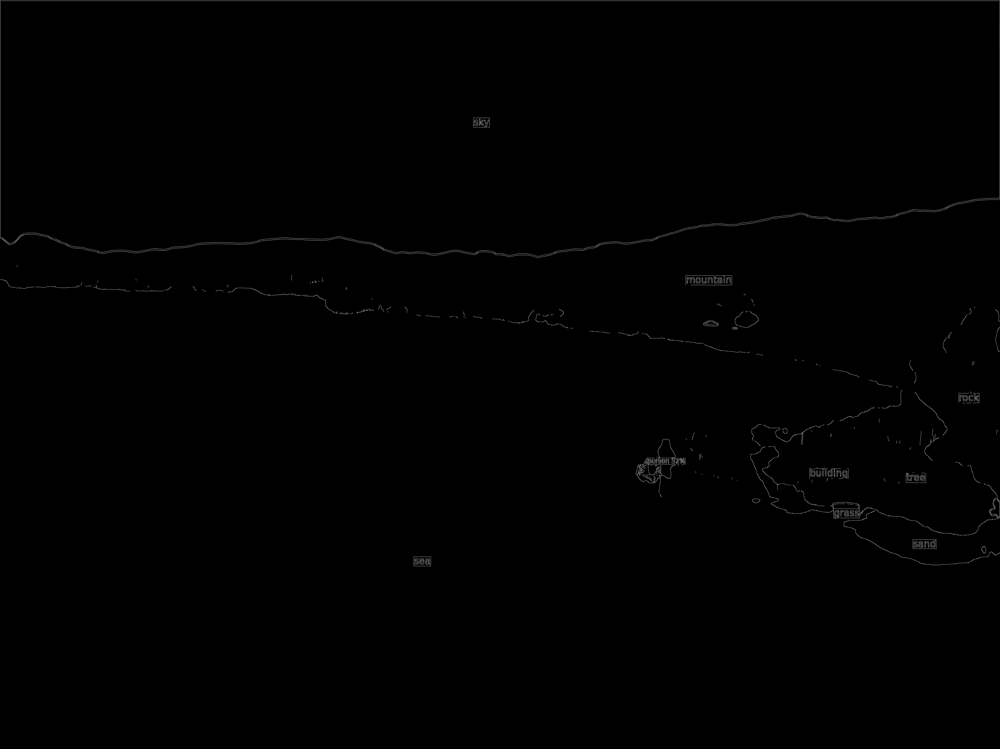

In [ ]:
blur =  cv2.GaussianBlur(out3.get_image()[:,:,::-1], (3,7), cv2.BORDER_DEFAULT)
canny_blur = cv2.Canny(blur, 125, 175)
cv2_imshow( canny_blur)

### We can see Dilation makes the Edges more prominent

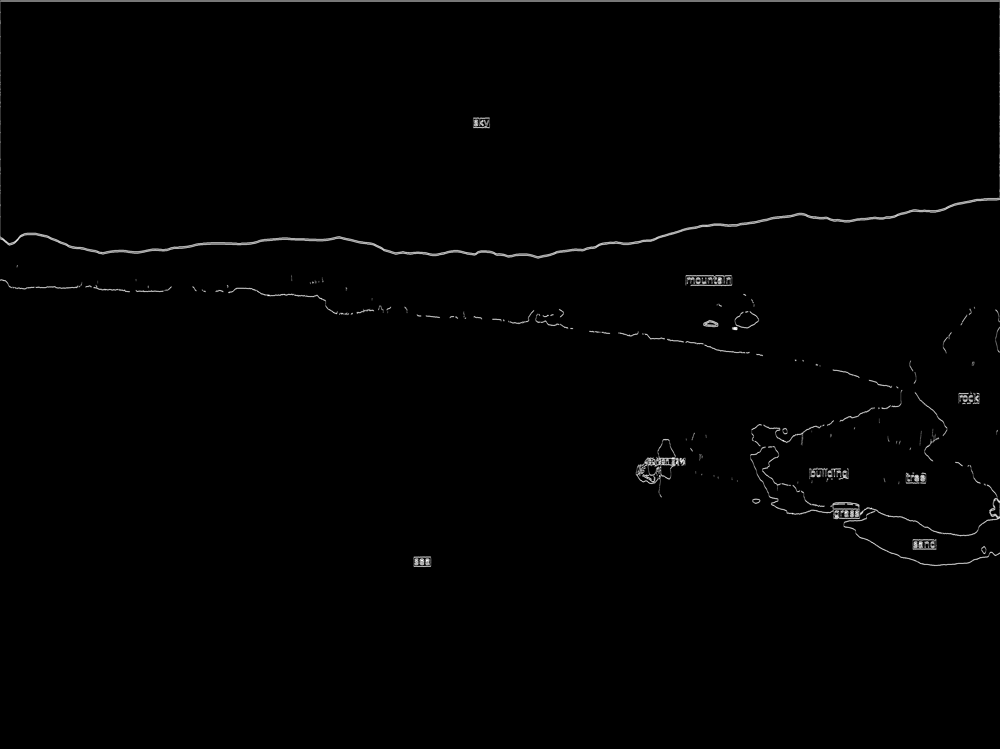

In [ ]:
dilated = cv2.dilate(canny_blur, (7,7), iterations=3)
cv2_imshow( dilated)

## Y axis difference matrix

In [ ]:
im = cv2.imread('input2.jpg')

zeros = np.zeros((3040,1))
result = np.diff(masked,  axis=1)

b = np.where(result > 0, 1, result)

metadata = MetadataCatalog.get(cfg.DATASETS.TRAIN[0])
v = Visualizer(im[:, :, ::-1], metadata, scale=1.2)
 

  

 
  
out2 = v.draw_panoptic_seg_predictions(torch.from_numpy(np.append(b, zeros, axis=1)), segment)

## The below cell contains the boundary line between the sea and the Mountain/Grass

In [ ]:
out = v.draw_panoptic_seg_predictions(torch.from_numpy(np.append(b, zeros, axis=1)+np.append(b1, [zeros1], axis=0)), segment)

## We can see the pink boundary line drew on the image

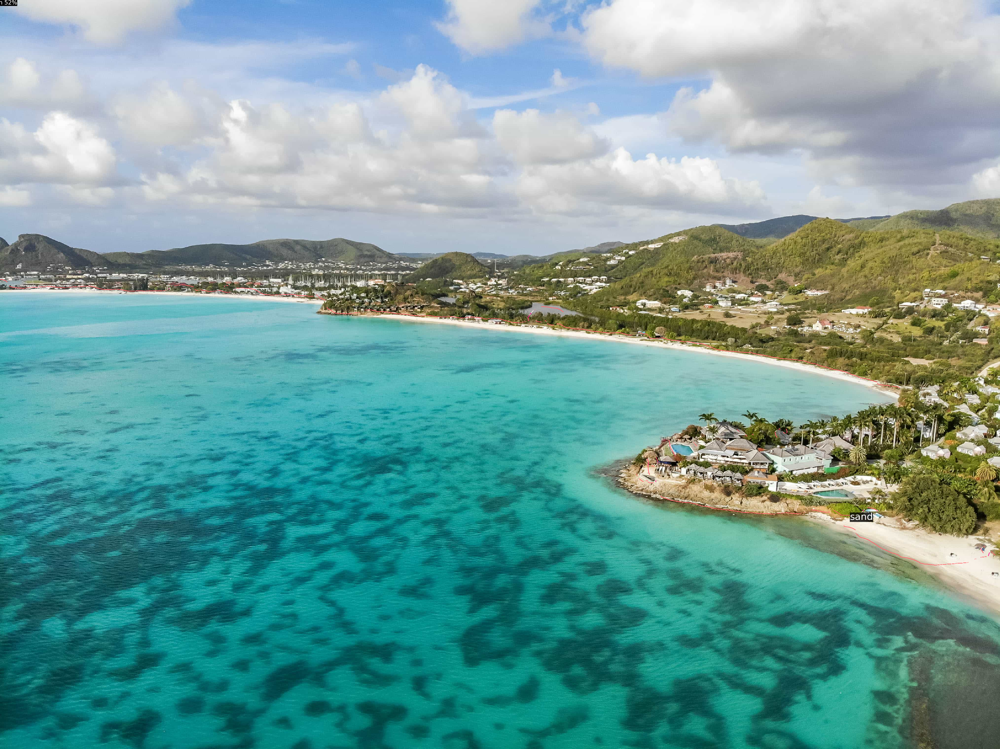

In [ ]:
masked = np.ma.masked_where(out.get_image()[:, :, ::-1]==1,out.get_image()[:, :, ::-1])

cv2_imshow(masked)

In [ ]:
from skimage.segmentation import mark_boundaries

pred

tensor([[5, 5, 5,  ..., 5, 5, 5],
        [5, 5, 5,  ..., 5, 5, 5],
        [5, 5, 5,  ..., 5, 5, 5],
        ...,
        [3, 3, 3,  ..., 3, 3, 3],
        [3, 3, 3,  ..., 3, 3, 3],
        [3, 3, 3,  ..., 3, 3, 3]], device='cuda:0', dtype=torch.int32)

person tensor([2667.0449, 1783.1875, 2745.1951, 1942.8928], device='cuda:0')
umbrella tensor([2715.6809, 1798.5762, 2817.7224, 1851.9226], device='cuda:0')
car tensor([3498.1755, 2070.1240, 3576.6528, 2116.7288], device='cuda:0')
umbrella tensor([2667.7849, 1794.5667, 2814.7356, 1871.5356], device='cuda:0')
car tensor([2575.1174, 1212.8350, 2688.4556, 1263.1644], device='cuda:0')
person tensor([2661.1248, 1738.8549, 2861.9541, 1903.2770], device='cuda:0')
person tensor([2673.2034, 1772.4520, 2715.9473, 1825.1254], device='cuda:0')
The average coordinate for the  sea  is  (1776.5008372151979, 2203.060940361885)


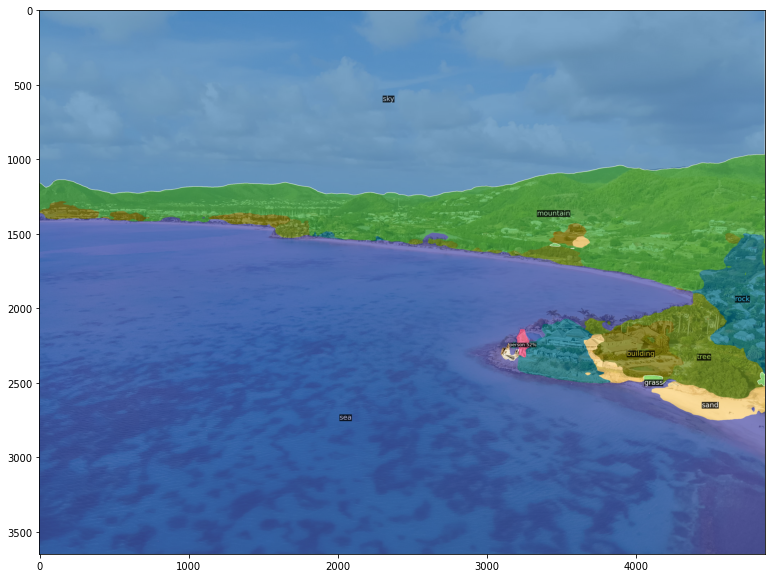

In [ ]:
pred, segment, stuff = show_img_pan('input2.jpg', 3)

In [ ]:
stuff_dict = [x for x in segment if x['isthing'] == False]
stuff_dict

[{'id': 2, 'isthing': False, 'category_id': 23, 'area': 108605.0},
 {'id': 3, 'isthing': False, 'category_id': 24, 'area': 6311400.0},
 {'id': 4, 'isthing': False, 'category_id': 37, 'area': 255143.0},
 {'id': 5, 'isthing': False, 'category_id': 40, 'area': 3892718.0},
 {'id': 6, 'isthing': False, 'category_id': 45, 'area': 1281707.0},
 {'id': 7, 'isthing': False, 'category_id': 46, 'area': 7769.0},
 {'id': 8, 'isthing': False, 'category_id': 50, 'area': 170390.0},
 {'id': 9, 'isthing': False, 'category_id': 51, 'area': 289974.0}]

In [ ]:
[x['category_id'] for x in stuff_dict if x['id'] == 5][0]

40

In [ ]:
[stuff[x["category_id"]] for x in stuff_dict]

['sand', 'sea', 'tree', 'sky', 'mountain', 'grass', 'building', 'rock']

'counter'

In [ ]:
segmentation_pred = pred.cpu().data.numpy()

In [ ]:
segmentation_pred

array([[5, 5, 5, ..., 5, 5, 5],
       [5, 5, 5, ..., 5, 5, 5],
       [5, 5, 5, ..., 5, 5, 5],
       ...,
       [3, 3, 3, ..., 3, 3, 3],
       [3, 3, 3, ..., 3, 3, 3],
       [3, 3, 3, ..., 3, 3, 3]], dtype=int32)